In [11]:
import os 
import pandas as pd
import airflow
from airflow.models import DagBag
import spacy

import nltk
from nltk.corpus import reuters
from nltk import bigrams, trigrams
from collections import Counter, defaultdict

In [12]:
# Create a placeholder for model
model = defaultdict(lambda: defaultdict(lambda: 0))
sents=['Impact of COVID-19 on Lung Allograft and Clinical Outcomes in Lung Transplant Recipients: A Case-Control Study.','Integrated analysis of multimodal single-cell data.','SARS-Cov-2 viral and serological screening of staff in 31 European fertility units.','Impact of COVID-19 on cancer care in India: a cohort study.','SARS-CoV-2 vaccines for all but a single dose for COVID-19 survivors.','Associations of baseline use of biologic or targeted synthetic DMARDs with COVID-19 severity in rheumatoid arthritis: Results from the COVID-19 Global Rheumatology Alliance physician registry.','COVID-19 Vaccine Acceptance Among Pregnant, Breastfeeding and Non-pregnant Reproductive Aged Women.','Changes in the incidence of invasive disease due to Streptococcus pneumoniae, Haemophilus influenzae, and Neisseria meningitidis during the COVID-19 pandemic in 26 countries and territories in the Invasive Respiratory Infection Surveillance Initiative: a prospective analysis of surveillance data.','Seroprevalence of SARS-CoV-2 antibodies in Seattle, Washington: October 2019-April 2020.','Cancer and SARS-CoV-2 Infection: A Third-Level Hospital Experience.','Differential association between inflammatory cytokines and multiorgan dysfunction in COVID-19 patients with obesity.','Urgent needs to accelerate the race for COVID-19 therapeutics.','Management of IBD Patients During the COVID-19 Pandemic.','Rapid disappearance of influenza following the implementation of COVID-19 mitigation measures in Hamilton, Ontario.','A novel strategy for SARS-CoV-2 mass screening with quantitative antigen testing of saliva: a diagnostic accuracy study.','COMMUNITY-BASED PREVALENCE ESTIMATES OF CHLAMYDIA TRACHOMATIS AND NEISSERIA GONORRHOEAE INFECTIONS AMONG GAY, BISEXUAL AND OTHER MEN WHO HAVE SEX WITH MEN IN MONTRÃ‰AL, CANADA.','Factors indicating intention to vaccinate with a COVID-19 vaccine among older U.S. adults.',]
# print(sents)
sent_tokens=[]
for sent in sents:
    token=sent.lower().split(' ') ###
    sent_tokens.append(token)
# print('break',token)
# print(sent_tokens)
   
for sentence in sent_tokens:
    for w1, w2, w3 in trigrams(sentence, pad_right=True, pad_left=True):
        print('trigram words in my sents w1:{},w2:{},w3:{}'.format(w1,w2,w3))
        
        model[(w1, w2)][w3] += 1
        print(w1,w2)
        
        
# Let's transform the counts to probabilities
for w1_w2 in model:
#     print(model[w1_w2].values())
    
    total_count = float(sum(model[w1_w2].values()))
#     print(total_count)
    
    for w3 in model[w1_w2]:
#         print(w3)
        model[w1_w2][w3] /= total_count
#         print(model)

trigram words in my sents w1:None,w2:None,w3:impact
None None
trigram words in my sents w1:None,w2:impact,w3:of
None impact
trigram words in my sents w1:impact,w2:of,w3:covid-19
impact of
trigram words in my sents w1:of,w2:covid-19,w3:on
of covid-19
trigram words in my sents w1:covid-19,w2:on,w3:lung
covid-19 on
trigram words in my sents w1:on,w2:lung,w3:allograft
on lung
trigram words in my sents w1:lung,w2:allograft,w3:and
lung allograft
trigram words in my sents w1:allograft,w2:and,w3:clinical
allograft and
trigram words in my sents w1:and,w2:clinical,w3:outcomes
and clinical
trigram words in my sents w1:clinical,w2:outcomes,w3:in
clinical outcomes
trigram words in my sents w1:outcomes,w2:in,w3:lung
outcomes in
trigram words in my sents w1:in,w2:lung,w3:transplant
in lung
trigram words in my sents w1:lung,w2:transplant,w3:recipients:
lung transplant
trigram words in my sents w1:transplant,w2:recipients:,w3:a
transplant recipients:
trigram words in my sents w1:recipients:,w2:a,w3:cas

In [13]:
dict(model['covid-19','on'])

{'lung': 0.5, 'cancer': 0.5}

## Hidden Markov Model ---> Viterbi algorithm
Motivation

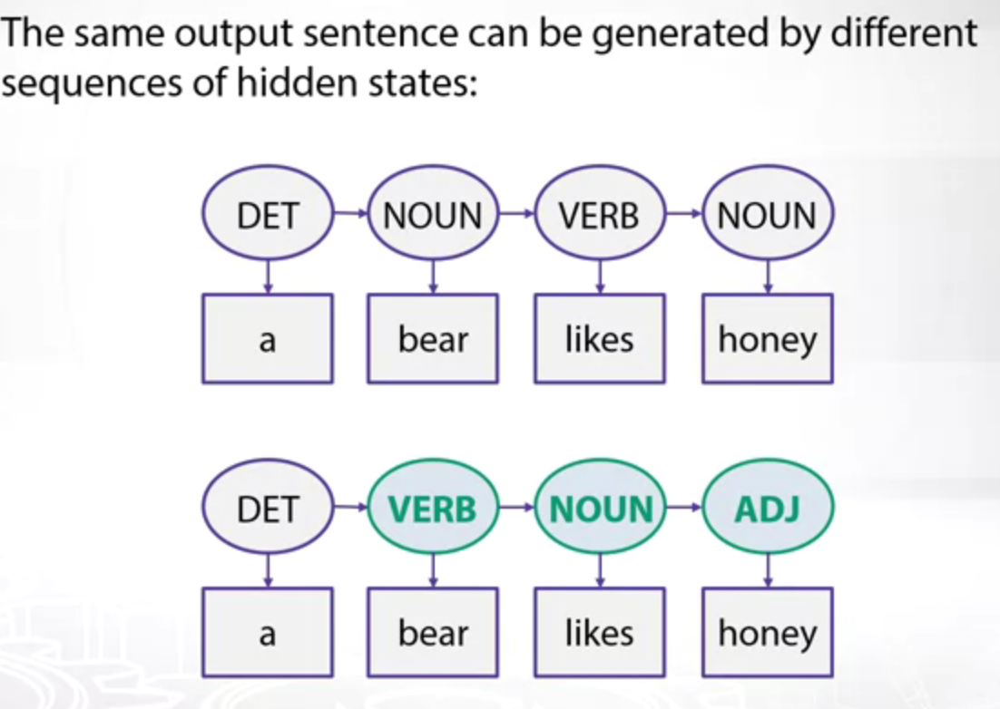

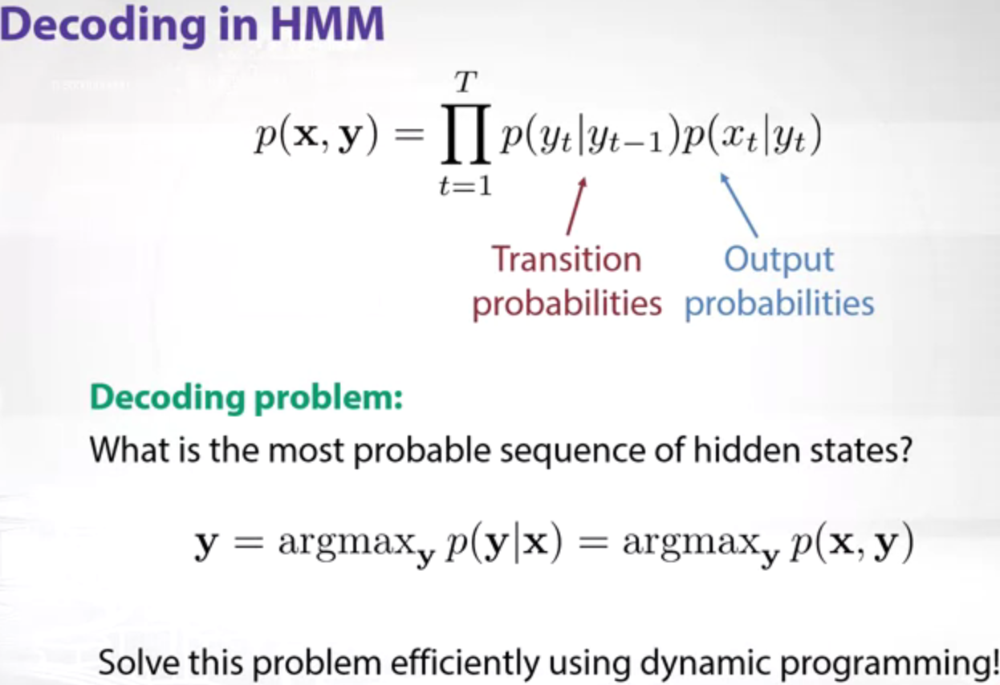

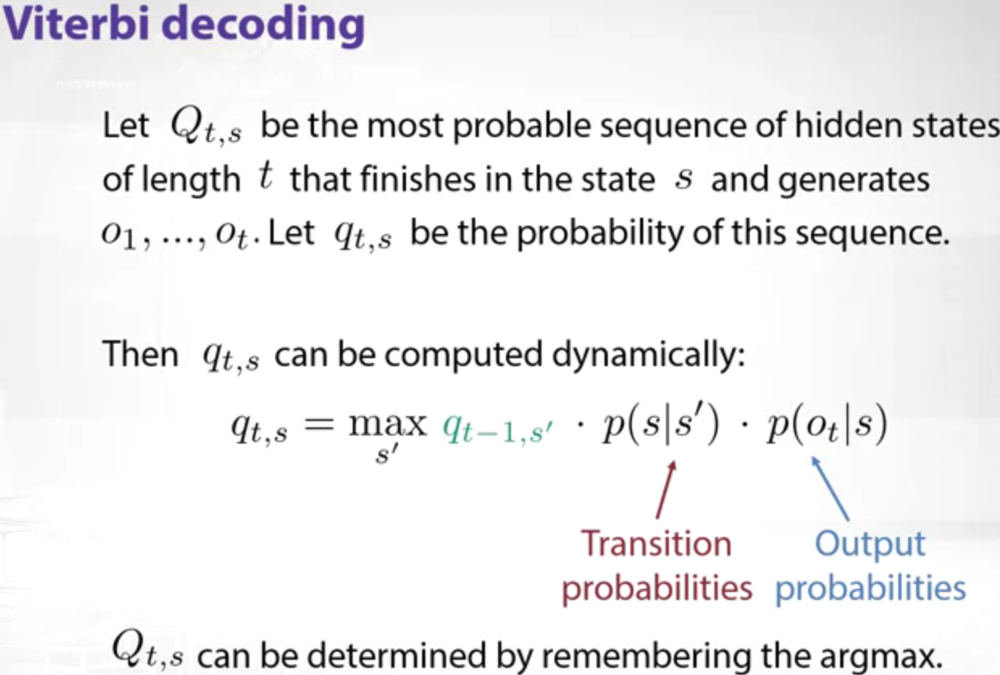

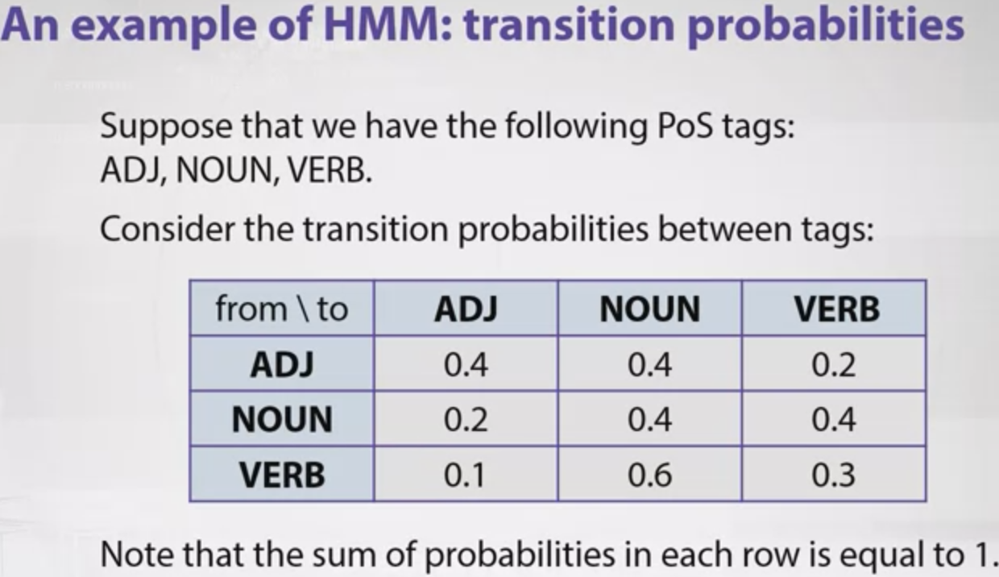

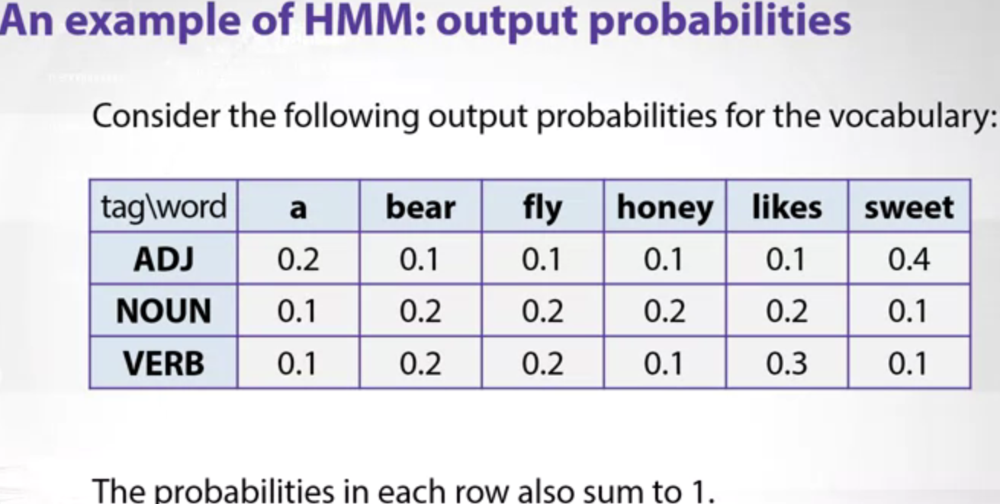

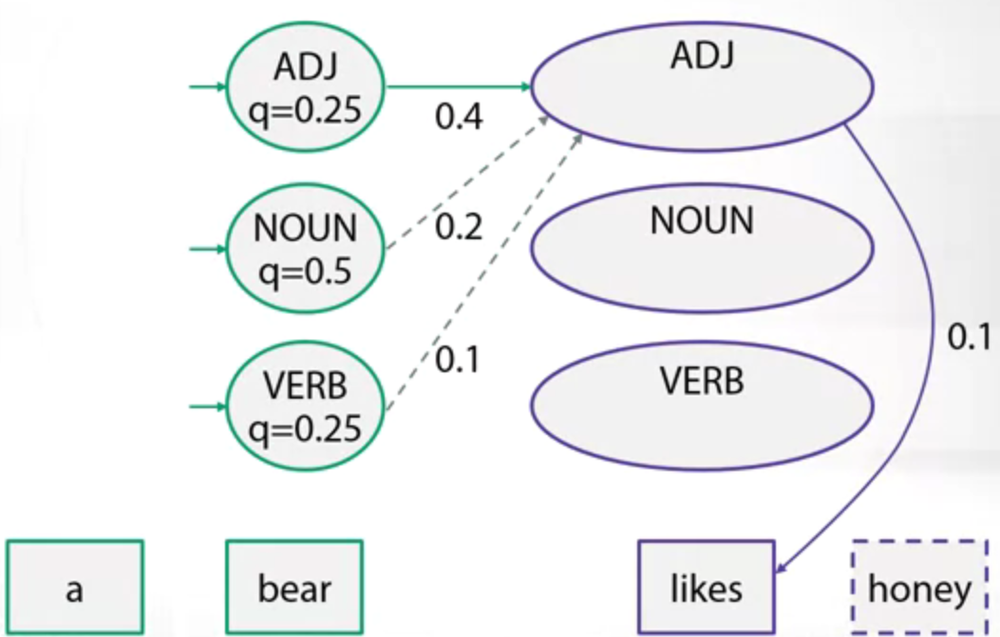

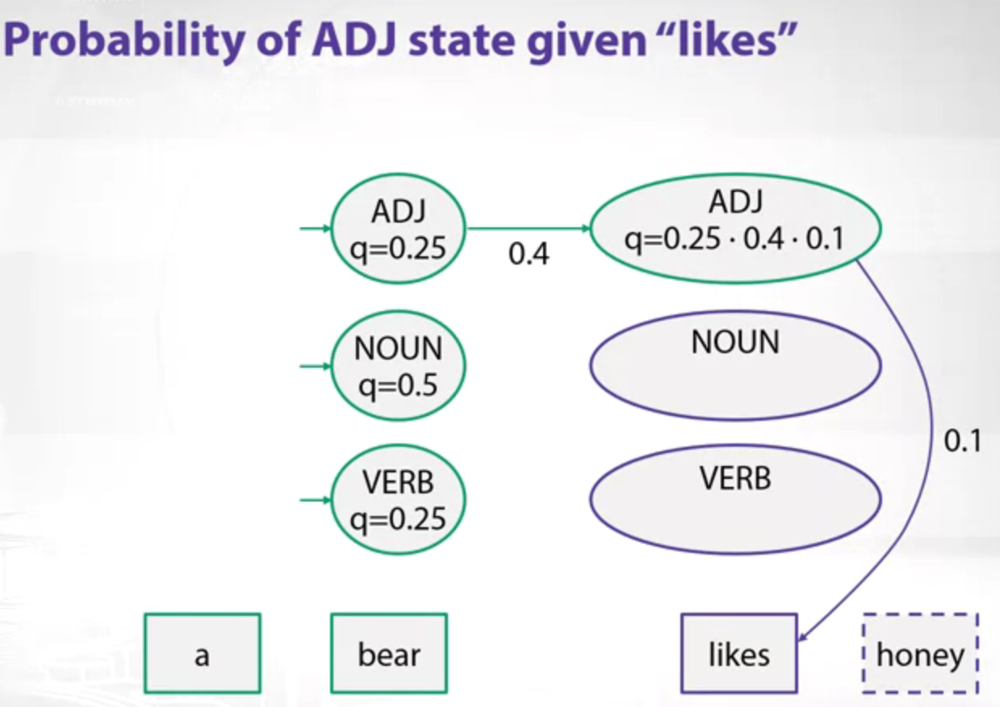

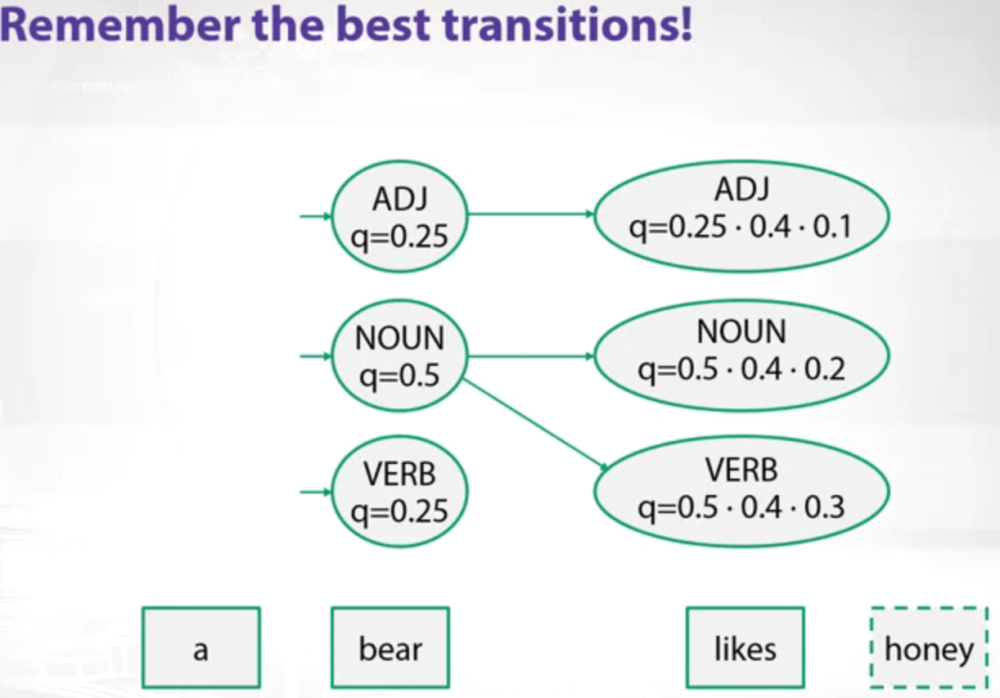

# Backtrace
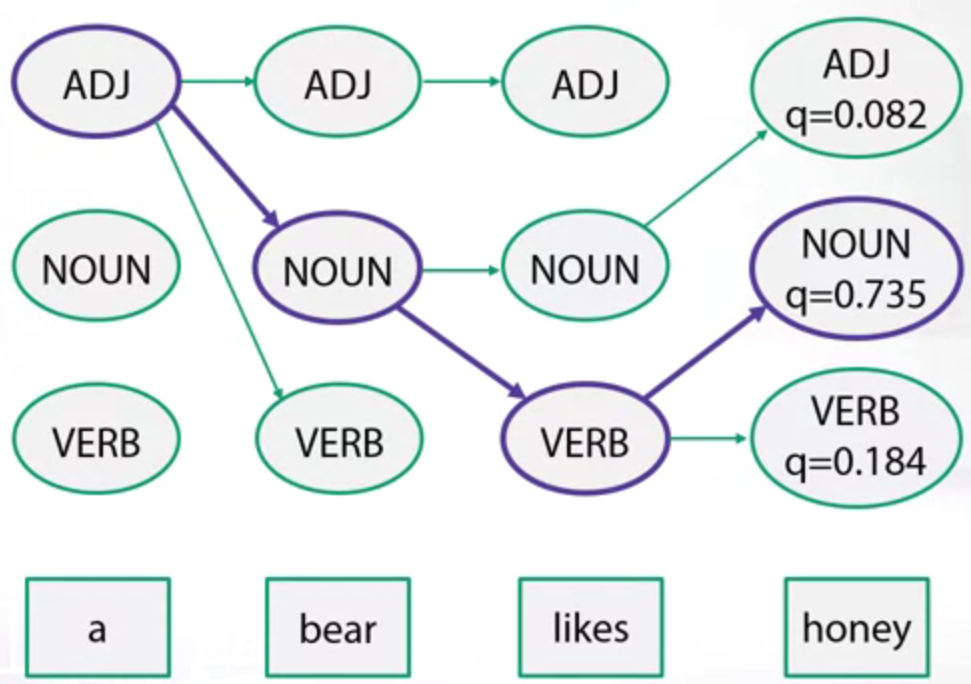

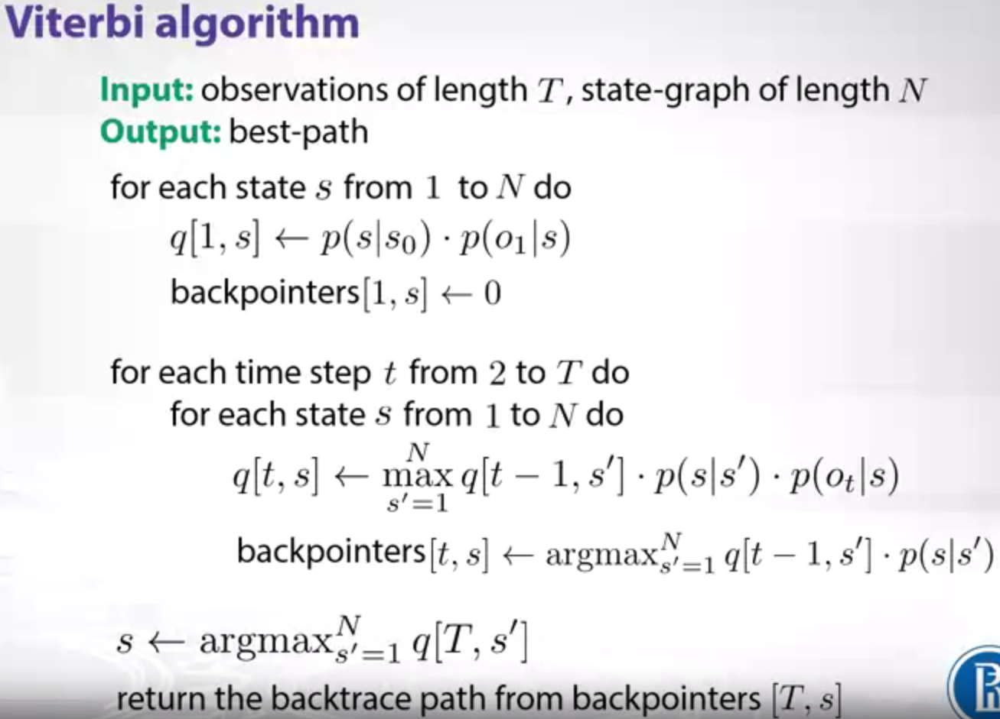

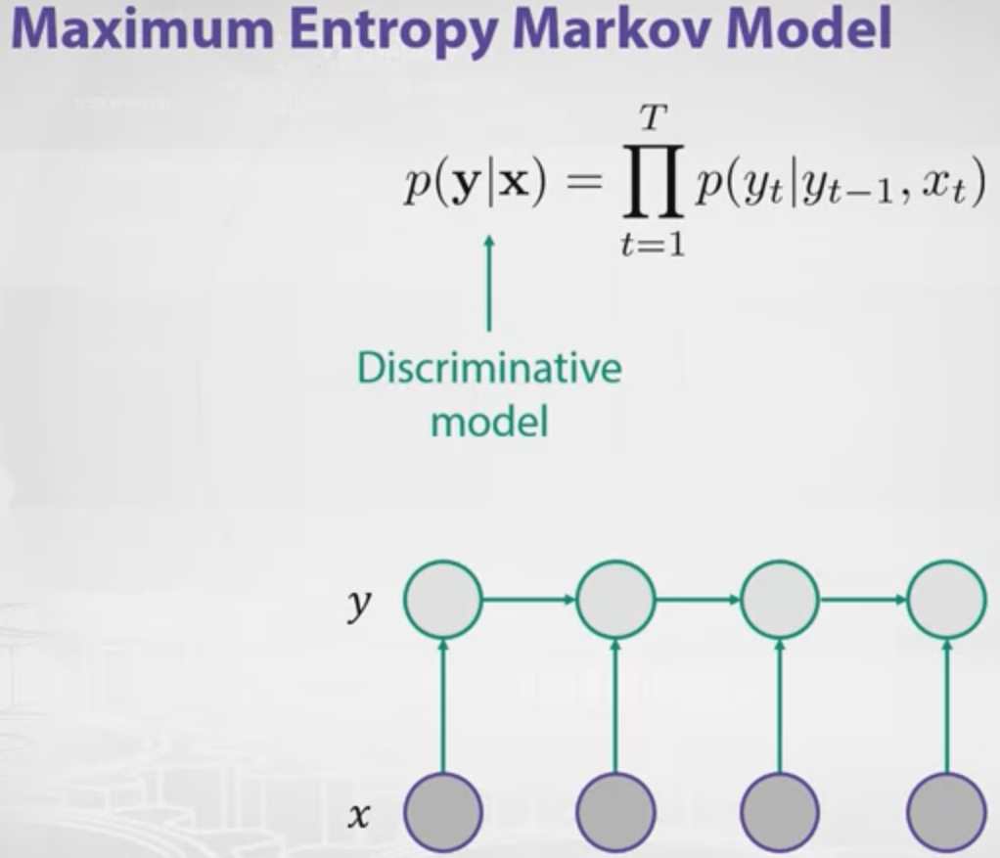

## It similar to softmax which is like Logistic Regression 
### Only features depends on previous or next state 

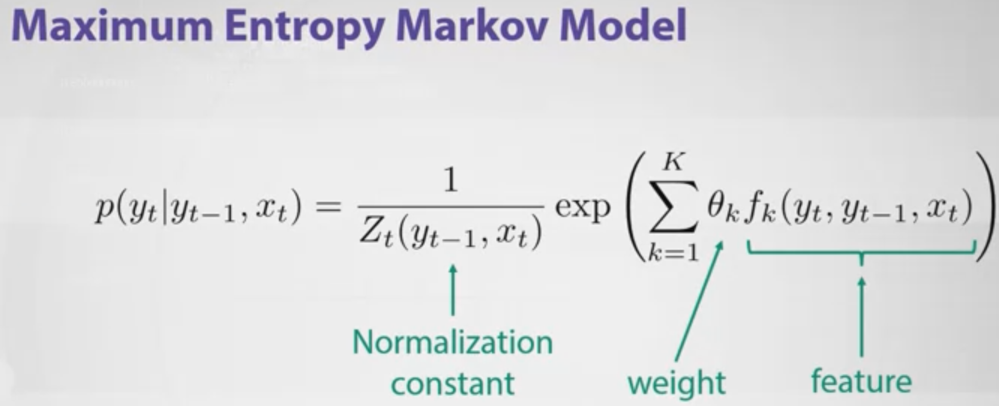

# 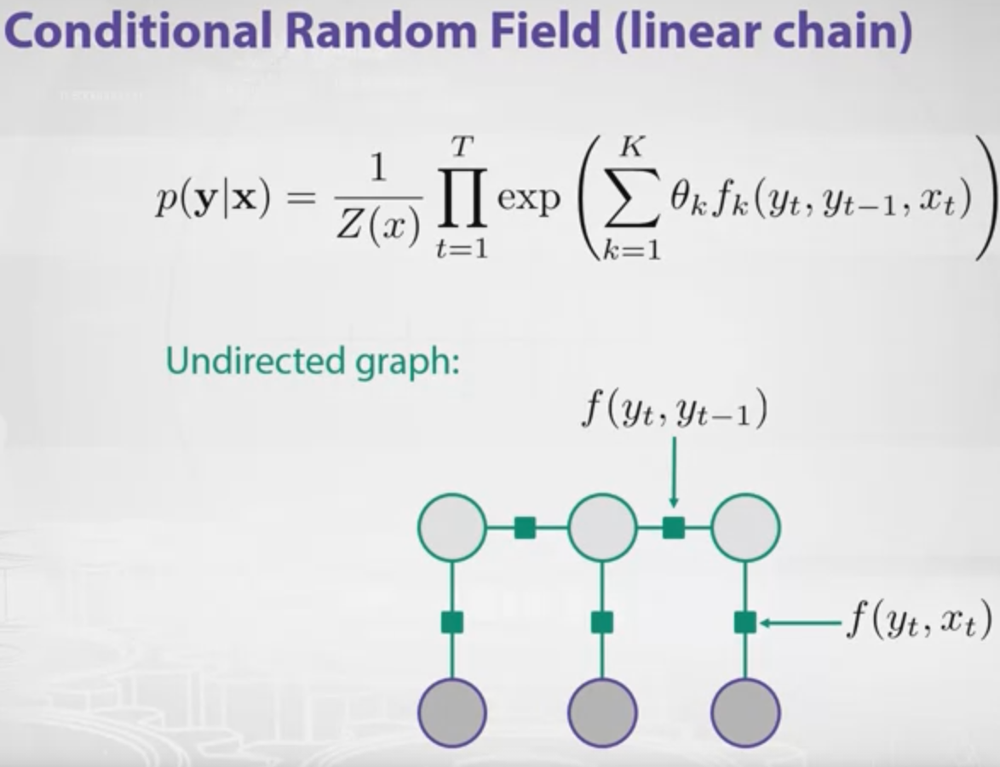

### Create features for CRF Model


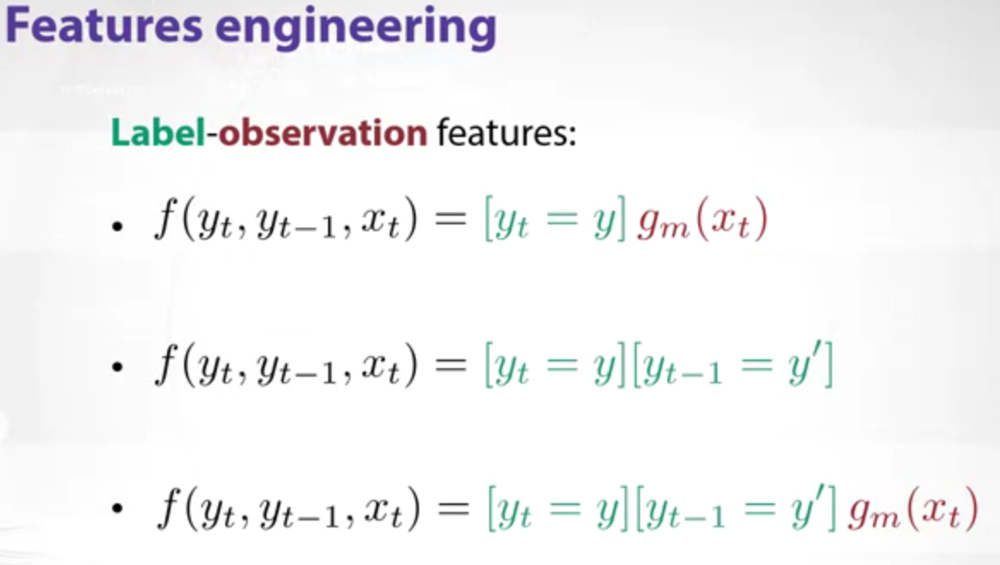

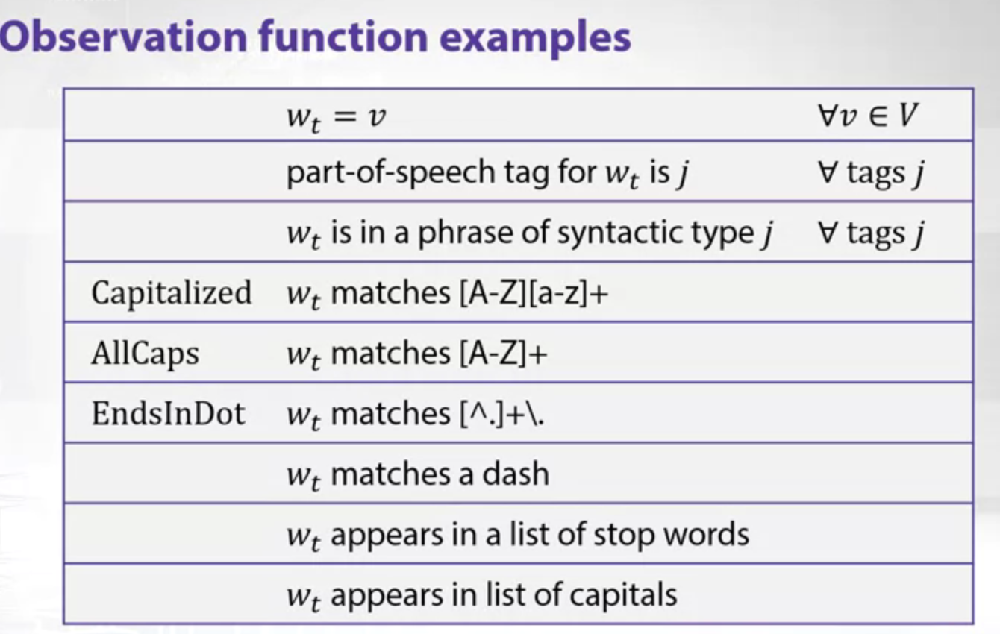

## Summary
Probabilities of tag sequences in HMMs
In this reading we recap hidden Markov models. We demonstrate how to compute probabilities of tag sequences and re-estimate parameters with Baum-Welch algorithm. You need to understand this to complete the quiz of this week.


Hidden Markov Model 

Consider the following rhyme from "Jabberwocky" by Lewis Caroll:

’Twas brillig, and the slithy toves

Did gyre and gimble in the wabe;

All mimsy were the borogoves,

And the mome raths outgrabe.

Let's take the last phrase, "the mome raths outgrabe",  as an example. Let's build a hidden Markov model for predicting part of speech tags in this sentence. For simplicity, suppose that we have just three tags: N (noun), V (verb) and D (determiner). We need to specify initial probabilities of these tags and transition probabilities from one tag to another. Surely, these probabilities may be estimated using some annotated corpus. But let's suppose for now that all tags and all transitions are equiprobable:

p(N | start) = p(O | start) = p(D | start) = 1/3p(N∣start)=p(O∣start)=p(D∣start)=1/3

p(N| N) = p(V | N) = p(D | N) = 1/3p(N∣N)=p(V∣N)=p(D∣N)=1/3

and so on.

Dealing with HMMs, we also need to specify output probabilities of words given the tag. For simplicity, we consider the following outcomes:

N: mome | raths | outgrabe

V: raths

D: the | a

Let all these outcomes be also equiprobable, i. e,

p(mome | N) = p(raths | N) = p(outgrabe | N) = 1/3p(mome∣N)=p(raths∣N)=p(outgrabe∣N)=1/3

p(raths | V)  = 1p(raths∣V)=1

p(the | D) = p (a | D) = 1/2p(the∣D)=p(a∣D)=1/2

 Note that some words like "raths" may be generated from different tags (otherwise, the tagging is trivial). Note also, that our test phrase does not have to contain all of these words. For example, "a" is absent in the test sentence.


Probabilities of tag sequences

Given this toy model, let's find the probabilities of possible tag sequences for the phrase "the mome raths outgrabe". In other words, these are the conditional probabilities: p(XXXX | phrase)p(XXXX∣phrase), where each tag X is either N, or V, or D.  

First question for you: how many different tag sequences exist? Second question: which of them could happen in our case with the transition and output probabilities defined above? 

Answers: there are 3^4 = 813 
4
 =81 sequences, but only two of them are possible in our case. "the" can be generated only from D, "mome" and "outgrabe" can be generated only from N, and "raths" can be generated wither from N or V. So we can have either DNNN or DNVN. 

So we have just seen, that probabilities of 79 tag sequences are equal to 0, and we need to compute these two: p(DNNN | phrase) and p(DNVN | phrase). According to the HMM model, the joint probabilities are:

p(DNVN, phrase) = p(D | start)\, p(the | D)\, p(N | D)\, p(mome | N)\, p(V | N)\, p(raths |V)\, p(N |V) \, p(outgrabe | N)p(DNVN,phrase)=p(D∣start)p(the∣D)p(N∣D)p(mome∣N)p(V∣N)p(raths∣V)p(N∣V)p(outgrabe∣N)

p(DNNN, phrase) = p(D | start)\,  p(the | D)\,  p(N | D)\,  p(mome | N) \, \boldsymbol{p(N | N)\,  p(raths |N) \,  p(N |N)} \,  p(outgrabe | N)p(DNNN,phrase)=p(D∣start)p(the∣D)p(N∣D)p(mome∣N)p(N∣N)p(raths∣N)p(N∣N)p(outgrabe∣N)

At this point, you could just use the given values above to compute these expressions. After that, you would need to normalize them in such a way that they sum into 1, since it should be a distribution, and all other 79 values are known to be 0. 

But let's reduce our calculations and look closer into the two formulas above. The only term that differs there is this one: p(raths |N) = 1/3p(raths∣N)=1/3 while p(raths|V) = 1p(raths∣V)=1.  So, for some multiplier x,

p(DNNN | phrase) = x \cdot 1/3 p(DNNN∣phrase)=x⋅1/3

p(DNVN | phrase) = x \cdot 1p(DNVN∣phrase)=x⋅1

Since these probabilities must sum into one, we find that they are equal to 1/41/4 and 3/43/4, and we are done.


Baum-Welch probability re-estimation

Now let's see how to re-estimate transition or output probabilities in our model, given the same sentence "the mome raths outgrabe". It means performing one iteration of Baum-Welch algorithm (= EM-algorithm). Actually, we have just done E-step by computing probabilities of tag sequences. Now let's see how the M-step works. For example, let's re-estimate the transition probability p(V|N)p(V∣N), that used to be one-third.

We need to find the expectation of the number of transitions from N to V and divide it to the expectation of the number of transitions from N to any tag. The expectation is taken with respect to the probabilities of tag sequences (computed above).

Remember, there are only two possible sequences. We have 0 transitions from N to V in the DNNN sequence and exactly one such transition in the DNVN sequence. So the expectation for (N -> V) transitions is 1/4 \cdot 0 + 3/4 \cdot 1 = 3/41/4⋅0+3/4⋅1=3/4. 

Similarly, we have two transitions from N to some tag in DNNN and 1 such transition in DNVN. The expectation for (N -> ?) transitions is 1/4 \cdot 2 + 3/4 \cdot 1 = 5/41/4⋅2+3/4⋅1=5/4. 

Thus, the new estimation for the transition probability p(V | N)p(V∣N) is 3/53/5. This is exactly the probability, that would be assigned to the corresponding HMM parameter if we were training it with Baum-Welch on this one phrase. 

In real examples though, the flow of computations in Baum-Welch is a bit different. First, usually you have too many tag sequences. So it's impossible to compute there probabilities and take the expectation with respect to them. E.g. imagine you have 20 possible tags and a sequence of length 10. Then you would have 20^{10}20 
10
  tag sequences! So instead of the probabilities of the whole sequences, you would compute the probabilities of two sequential tags (see the slides). These probabilities would be enough to perform M-step. Second, it is hard to compute even these tag pair probabilities, so here a so called Forward-Backward algorithm is used. It's a dynamic programming algorithm that allows efficient computations. 

However, we skipped all these computational details for this small example and so do you in the upcoming quiz.

# Tokenization

## Hugging Face 

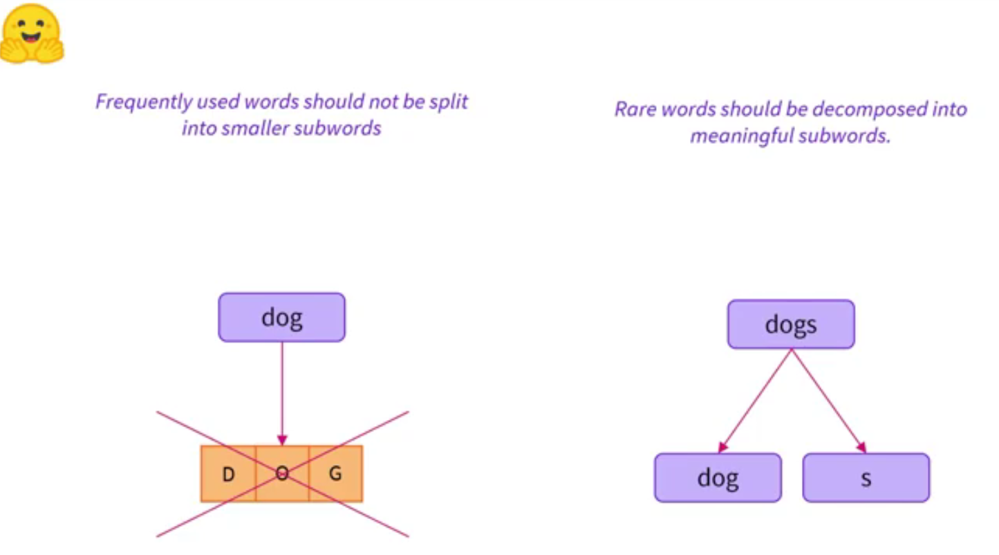

### Reference
https://huggingface.co/transformers/tokenizer_summary.html \
https://heartbeat.fritz.ai/hands-on-with-hugging-faces-new-tokenizers-library-baff35d7b465 \
https://www.kaggle.com/funtowiczmo/hugging-face-tutorials-training-tokenizer 

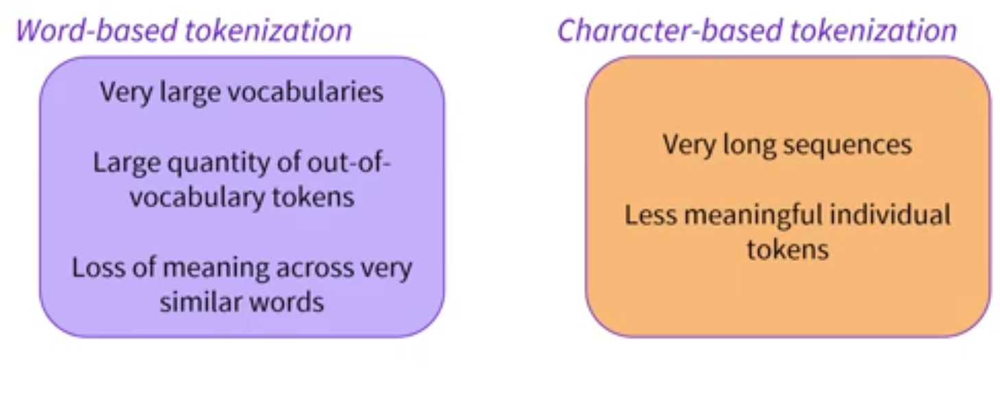

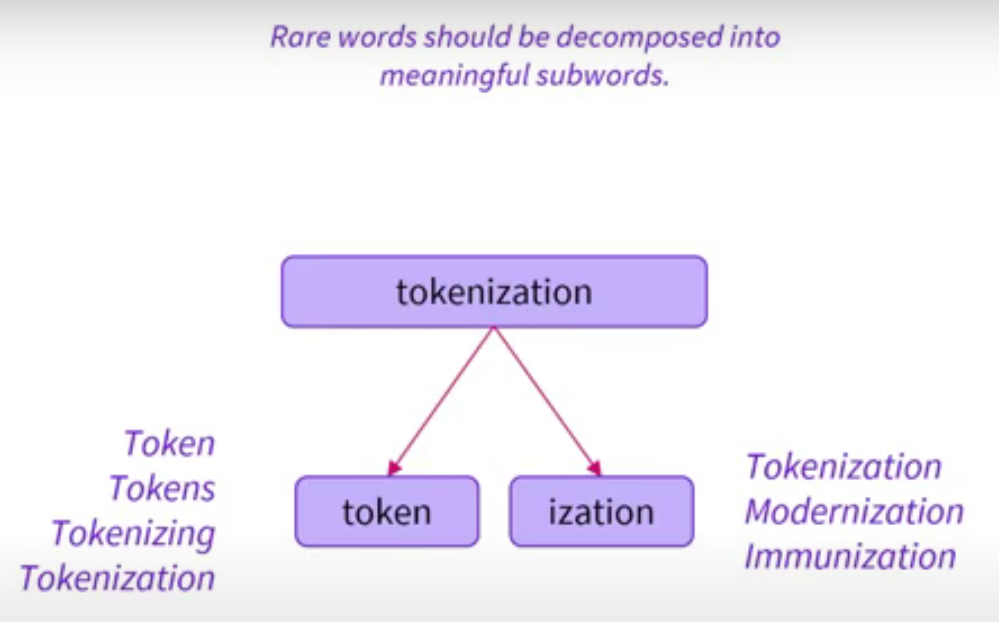

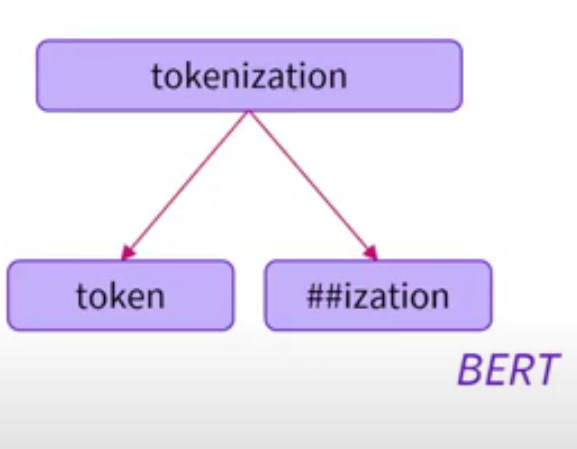

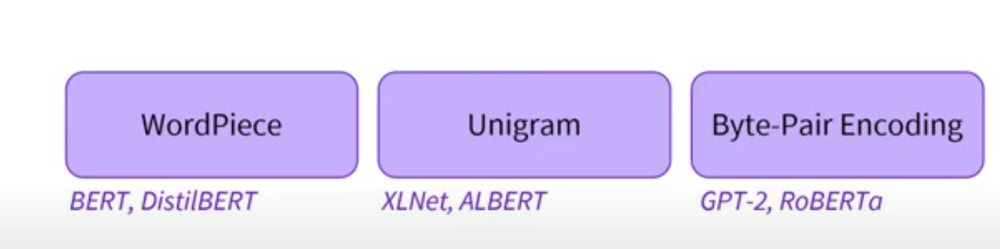

## Uses 
### To Reduce Vocabulary sizes
### Sharing information across different words

#### How do you use a hugging face Tokenizer?

You can use the same tokenizer for all of the various BERT models that hugging face provides. As BERT can only accept/take as input only 512 tokens at a time, we must specify the truncation parameter to True. The add special tokens parameter is just for BERT to add tokens like the start, end, [SEP], and [CLS] tokens.

##  Examples
### ["gp" and "##u"]. "##" means that the rest of the token should be attached to the previous one, without space (for decoding or reversal of the tokenization).idea/

In [64]:

from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
# print(tokenizer.tokenize("I have a new GPU!"))
from transformers import XLNetTokenizer
XLtokenizer = XLNetTokenizer.from_pretrained("xlnet-base-cased")


In [140]:
sents=['Impact of COVID-19 on Lung Allograft and Clinical Outcomes in Lung Transplant Recipients: A Case-Control Study.','Integrated analysis of multimodal single-cell data.','SARS-Cov-2 viral and serological screening of staff in 31 European fertility units.','Impact of COVID-19 on cancer care in India: a cohort study.','SARS-CoV-2 vaccines for all but a single dose for COVID-19 survivors.','Associations of baseline use of biologic or targeted synthetic DMARDs with COVID-19 severity in rheumatoid arthritis: Results from the COVID-19 Global Rheumatology Alliance physician registry.','COVID-19 Vaccine Acceptance Among Pregnant, Breastfeeding and Non-pregnant Reproductive Aged Women.','Changes in the incidence of invasive disease due to Streptococcus pneumoniae, Haemophilus influenzae, and Neisseria meningitidis during the COVID-19 pandemic in 26 countries and territories in the Invasive Respiratory Infection Surveillance Initiative: a prospective analysis of surveillance data.','Seroprevalence of SARS-CoV-2 antibodies in Seattle, Washington: October 2019-April 2020.','Cancer and SARS-CoV-2 Infection: A Third-Level Hospital Experience.','Differential association between inflammatory cytokines and multiorgan dysfunction in COVID-19 patients with obesity.','Urgent needs to accelerate the race for COVID-19 therapeutics.','Management of IBD Patients During the COVID-19 Pandemic.','Rapid disappearance of influenza following the implementation of COVID-19 mitigation measures in Hamilton, Ontario.','A novel strategy for SARS-CoV-2 mass screening with quantitative antigen testing of saliva: a diagnostic accuracy study.','COMMUNITY-BASED PREVALENCE ESTIMATES OF CHLAMYDIA TRACHOMATIS AND NEISSERIA GONORRHOEAE INFECTIONS AMONG GAY, BISEXUAL AND OTHER MEN WHO HAVE SEX WITH MEN IN MONTRÃ‰AL, CANADA.','Factors indicating intention to vaccinate with a COVID-19 vaccine among older U.S. adults.',]
for sent in sents:
    token=tokenizer.tokenize(sent)
    
    XLtoken=XLtokenizer.tokenize(sent)
    print('Bert based tokens:',token,'\n')


Bert based tokens: ['impact', 'of', 'co', '##vid', '-', '19', 'on', 'lung', 'all', '##og', '##raf', '##t', 'and', 'clinical', 'outcomes', 'in', 'lung', 'transplant', 'recipients', ':', 'a', 'case', '-', 'control', 'study', '.'] 

Bert based tokens: ['integrated', 'analysis', 'of', 'multi', '##mo', '##dal', 'single', '-', 'cell', 'data', '.'] 

Bert based tokens: ['sar', '##s', '-', 'co', '##v', '-', '2', 'viral', 'and', 'ser', '##ological', 'screening', 'of', 'staff', 'in', '31', 'european', 'fertility', 'units', '.'] 

Bert based tokens: ['impact', 'of', 'co', '##vid', '-', '19', 'on', 'cancer', 'care', 'in', 'india', ':', 'a', 'co', '##hort', 'study', '.'] 

Bert based tokens: ['sar', '##s', '-', 'co', '##v', '-', '2', 'vaccines', 'for', 'all', 'but', 'a', 'single', 'dose', 'for', 'co', '##vid', '-', '19', 'survivors', '.'] 

Bert based tokens: ['associations', 'of', 'baseline', 'use', 'of', 'bio', '##logic', 'or', 'targeted', 'synthetic', 'd', '##mar', '##ds', 'with', 'co', '##vid',

In [137]:
###
import os 
import re
import pandas as pd
input_file='../NLP/Data/NCBI_disease_corpus/NCBI_preprocess_data.txt'



def convert_to_pandas(input_corpus_file):

    regex_title = re.compile("^(\d+)\|t\|(.*)$")
    regex_abstract = re.compile("^(\d+)\|a\|(.*)$")
    regex_annotation = re.compile("^(\d+)\t(\d+)\t(\d+)\t([^\t]+)\t([^\t]+)\t([^\t]+)$")

    instances = dict()
    
    with open(os.path.abspath(input_corpus_file), "r", encoding="UTF-8") as input_file:
        for line in input_file:
            if re.match("^$", line):
                continue

            match_title = regex_title.match(line)
            if match_title:
                instances[int(match_title.group(1))] = {
                    "title": match_title.group(2),
                    "annotations": list()
                }

            match_abstract = regex_abstract.match(line)
            if match_abstract:
                instances[int(match_abstract.group(1))]["abstract"] = match_abstract.group(2)
                print(instances)

            match_annotation = regex_annotation.match(line)
            if match_annotation:
                instances[int(match_annotation.group(1))]["annotations"].append({
                    "begin": int(match_annotation.group(2)),
                    "end": int(match_annotation.group(3)),
                    "text": match_annotation.group(4),
                    "entity": match_annotation.group(5),
                    "tokens": list()
                })
    disease_df=pd.DataFrame.from_dict(instances)
    disease_df=disease_df.transpose()
    return disease_df




In [138]:
disease_data=convert_to_pandas(input_file)
disease_data.head()

8808605|t|Somatic-cell selection is a major determinant of the blood-cell phenotype in heterozygotes for glucose-6-phosphate dehydrogenase mutations causing severe enzyme deficiency.

8808605|a|X-chromosome inactivation in mammals is regarded as an essentially random process, but the resulting somatic-cell mosaicism creates the opportunity for cell selection. In most people with red-blood-cell glucose-6-phosphate dehydrogenase (G6PD) deficiency, the enzyme-deficient phenotype is only moderately expressed in nucleated cells. However, in a small subset of hemizygous males who suffer from chronic nonspherocytic hemolytic anemia, the underlying mutations (designated class I) cause more-severe G6PD deficiency, and this might provide an opportunity for selection in heterozygous females during development. In order to test this possibility we have analyzed four heterozygotes for class I G6PD mutations  two with G6PD Portici (1178G-- > A) and two with G6PD Bari (1187C-- > T). We found that in 

AttributeError: 'NoneType' object has no attribute 'head'

In [136]:
import spacy
from spacy import displacy
from pathlib import Path

nlp = spacy.load("en_core_web_sm")


In [102]:
for abstract in disease_data['abstract']:
    doc = nlp(abstract)
    displacy.serve(doc, style="ent")
#     displacy.serve(doc, style="dep")
    break


Using the 'ent' visualizer
Serving on http://0.0.0.0:5000 ...

Shutting down server on port 5000.


In [96]:
doc={
    "text": "But Google is starting from behind.",
    "ents": [{"start": 4, "end": 10, "label": "ORG"}],
    "title": None
}
displacy.serve(doc, style="ent",manual=True)

C:\Users\HP\anaconda3\lib\site-packages\spacy\displacy\__init__.py:94: UserWarning: [W011] It looks like you're calling displacy.serve from within a Jupyter notebook or a similar environment. This likely means you're already running a local web server, so there's no need to make displaCy start another one. Instead, you should be able to replace displacy.serve with displacy.render to show the visualization.
  warnings.warn(Warnings.W011)



Using the 'ent' visualizer
Serving on http://0.0.0.0:5000 ...

Shutting down server on port 5000.


In [98]:
disease_data['annotations'].iloc[0]

[{'begin': 154,
  'end': 171,
  'text': 'enzyme deficiency',
  'entity': 'DiseaseClass',
  'tokens': []},
 {'begin': 376,
  'end': 427,
  'text': 'glucose-6-phosphate dehydrogenase (G6PD) deficiency',
  'entity': 'SpecificDisease',
  'tokens': []},
 {'begin': 572,
  'end': 611,
  'text': 'chronic nonspherocytic hemolytic anemia',
  'entity': 'SpecificDisease',
  'tokens': []},
 {'begin': 677,
  'end': 692,
  'text': 'G6PD deficiency',
  'entity': 'SpecificDisease',
  'tokens': []},
 {'begin': 1368,
  'end': 1383,
  'text': 'G6PD deficiency',
  'entity': 'SpecificDisease',
  'tokens': []}]

In [128]:
# import seaborn as sns
# from collections import Counter
# results = Counter()
# data=disease_data['abstract'].str.lower().str.split().apply(results.update)

# df = pd.DataFrame( results.keys(),results.values())

# df
# # df = df.rename(columns={0:'word',1:'word_count'})
# # df
# # sns.barplot(x = 'word_count', y = df['word_count'].value_counts(), data = df, ci = None)

In [139]:
corpus_data='../NLP/Data/NCBI_disease_corpus/NCBI_corpus_development.txt'
with open(os.path.abspath(corpus_data), "r", encoding="UTF-8") as input_file:
        for line in input_file:
            print(line)


8589722	BRCA1 is secreted and exhibits properties of a granin.	Germline mutations in BRCA1 are responsible for most cases of <category="CompositeMention">inherited breast and ovarian cancer </category>. However , the function of the BRCA1 protein has remained elusive . We now show that BRCA1 encodes a 190-kD protein with sequence homology and biochemical analogy to the granin protein family . Interestingly , BRCA2 also includes a motif similar to the granin consensus at the C terminus of the protein . Both BRCA1 and the granins localize to secretory vesicles , are secreted by a regulated pathway , are post-translationally glycosylated and are responsive to hormones . As a regulated secretory protein , BRCA1 appears to function by a mechanism not previously described for <category="Modifier">tumour</category> suppressor gene products . . 

8589723	<category="Modifier">Ovarian cancer</category> risk in BRCA1 carriers is modified by the HRAS1 variable number of tandem repeat (VNTR) locus.

In [130]:
bert_tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
XLnet_tokenizer=XLtokenizer.tokenize(sent)
   

In [82]:
def bert_base_tokenization(sents):
    return(bert_tokenizer.tokenize(sents))
def XLnet_tokenization(sents):
    return(XLnet_tokenizer.tokenize(sents))    



In [84]:
disease_data['totalwords'] = disease_data['abstract'].str.split().str.len()
disease_data['Bert_based_uncased']=disease_data['abstract'].apply(bert_base_tokenization)

# disease_data['xlnet-base-cased']=disease_data['abstract'].apply(XLnet_tokenization)
disease_data.head()

,title,annotations,abstract,totalwords,Bert_based_uncased
8808605,Somatic-cell selection is a major determinant ...,"[{'begin': 154, 'end': 171, 'text': 'enzyme de...",X-chromosome inactivation in mammals is regard...,194,"[x, -, chromosome, ina, ##ct, ##ivation, in, m..."
9050866,"The ataxia-telangiectasia gene product, a cons...","[{'begin': 4, 'end': 25, 'text': 'ataxia-telan...",The product of the ataxia-telangiectasia gene ...,149,"[the, product, of, the, ata, ##xia, -, tel, ##..."
9012409,Molecular basis for Duarte and Los Angeles var...,"[{'begin': 20, 'end': 63, 'text': 'Duarte and ...",Human orythrocytes that are homozygous for the...,304,"[human, or, ##yt, ##hr, ##ocytes, that, are, h..."
8755645,An intronic mutation in a lariat branchpoint s...,"[{'begin': 78, 'end': 102, 'text': 'inherited ...",The first step in the splicing of an intron fr...,209,"[the, first, step, in, the, sp, ##lic, ##ing, ..."
8751855,Genetic heterogeneity in hereditary breast can...,"[{'begin': 25, 'end': 49, 'text': 'hereditary ...",The common hereditary forms of breast cancer h...,238,"[the, common, hereditary, forms, of, breast, c..."


In [ ]:
### unique list of annotation

# Tagging Schemes
The task of named entity recognition is to assign a named entity label to every word in a sentence.A single named entity could span several tokens within a sentence.\

## Sentences are usually represented in the various formats


### BIO format(Beginning, Inside, Outside)
BIO (Beginning, Inside, Outside) schema is a common tagging format for tagging sentence tokens for NER.

### IOB format (Inside, Outside, Beginning)
where every token is labeled as 
B-label -->if the token is the beginning of a named entity, \
I-label -->if it is inside a named entity but not the first token within the named entity,\
O-label --> otherwise.

### IOBES tagging scheme
IOB commonly used for named entity recognition, which encodes information about singleton entities(S) and explicitly marks the end of named entities(E).

Tagging a word as I-label with high-confidence narrows down the choices for the subsequent word to I-label or E-label, however,
the IOB scheme is only capable of determining that the subsequent word cannot be the interior of another label

### Pdf read and NER with spacy

In [ ]:
# !pip install PyPDF2
import re
import spacy
import PyPDF2
# !pip install pdfminer
import pdfminer
nlp=spacy.load('en_core_web_sm')
import spacy.displacy as displacy
from pathlib import Path



pdffile=open('../Papers/gkz389.pdf','rb')
# pdffile=open('../Airflow_modules/Patent/Patbase/PatBaseRestAPI.pdf','rb')
pdf_reader=PyPDF2.PdfFileReader(pdffile)
num_pages=pdf_reader.getNumPages()
num_pages

##############################
page1=pdf_reader.getPage(0)
page1_text=page1.extractText()
page2=pdf_reader.getPage(1)
page2_text=page2.extractText()
# print(page2_text)
# doc=nlp(page1_text)
# for ent in doc.ents:
#     print(ent.text,ent.start_char,ent.end_char,ent.label_)
# pages='\n'
# displacy.serve(doc,style='ent')
pages='\n'
for i in range(num_pages):

    page=pdf_reader.getPage(i)
    
    page_text=page.extractText()
    
    
    for i in page_text.split('\n'):
        print(i)
        break
    
    pages+=page_text
    break
# print(pages)
        

# with open ('../Papers/paper.txt', 'w',encoding='utf-8') as fp:
#     fp.write(pages)

# paper_text_path=open('../Papers/paper.txt')
# paper_text=paper_text_path.read()
# doc=nlp(paper_text)
# displacy.render(doc,style='ent',jupyter=False)
# displacy.serve(doc,style='ent')
# output_path = Path("../Papers/NER_plot.svg")
# output_path.open("w").write(svg)




###############################url fetch############################
# url_lists=[]
    
# for line in page_text.split('\n'):
#     urls = re.findall('https?://(?:[-\w.]|(?:%[\da-fA-F]{2}))+', line)
#     print(urls)
#     url_lists.append(urls)
        
    
#     print(url_lists)

## Note ##
* p-value scores (2nd column) are minus log p-values. 11 phrases have no scores (i.e. Not Available) because those were obtained from the same phrases but ending in 's.
* BM25 scores (3rd column) are average precision for single word- (left) and phrase-based (right) searches, respectively.


In [15]:
spacy

In [6]:
import requests

from newsfetch.news import newspaper

In [8]:
news=newspaper("https://www.cytivalifesciences.com/en/us")

C:\Users\HP\anaconda3\lib\site-packages\urllib3\connectionpool.py:979: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.cytivalifesciences.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  warnings.warn(


In [10]:
print(news.article)

Genetic medicine innovator Precision NanoSystems joins Danaher Life Sciences platform Precision NanoSystems (PNI), an innovator in lipid nanoparticles, joins the Danaher Life Sciences platform as a strong complement to Pall Corporation and Cytiva. Together, we will further enable you in your development of genetic medicines and in advancing your science to improve the lives of patients. Lipid nanoparticles are a key technology for making mRNA therapeutics and other genetic medicines. The PNI Genetic Medicine Toolkit contains proprietary lipid nanoparticle and microfluidic manufacturing platforms.


In [11]:
import ftplib
import 
mesh_rdf_path='ftp://ftp.nlm.nih.gov/online/mesh/rdf/mesh.nt.gz'


In [1]:
# import shutil
# import urllib.request as request
# from contextlib import closing

# with closing(request.urlopen('ftp://ftp.nlm.nih.gov/online/mesh/rdf/2021/mesh2021.nt.gz')) as r:
#     with open('mesh_rdf_2021', 'wb') as f:
#         shutil.copyfileobj(r, f)